In [282]:
fig_target_dir = "./Figures/Y_maze/B_CPP_plots/"
data_target_dir = "./Data/processed_data/Y_maze/for_b_cpp_calculation/simulated_data/"
data_target_dir_ideal = "./Data/processed_data/Y_maze/ideal_observer/simulated_data/"
data_target_dir_cbgt = "./Data/processed_data/cbgt_nw/"


In [283]:
import glob
import numpy as np
import pickle
import seaborn as sns
import pylab as pl
import pandas as pd
from pickle_objects import save_object, load_object
import matplotlib.pyplot as plt

plt.rcParams["figure.facecolor"] = "w"


In [284]:
files = glob.glob(data_target_dir+"sim*.pkl")
file_io = glob.glob(data_target_dir_ideal+"sim*.pkl")
file_cbgt = glob.glob(data_target_dir_cbgt+"sim*.pkl")


In [287]:
def fill_b_cpp_df(files):

    B_CPP_df = pd.DataFrame(columns=["Volatility","Condition","Conflict","Session","B-0","B-1","CPP","Trial","B_diff","change_point","Block"])

    for f in files:
        temp = pd.DataFrame(columns =["Volatility","Condition","Conflict","Session","B-0","B-1","CPP","Trial","B_diff","change_point","Block"])
        
        if "cbgt" in f: 
            if "with" in f:
                continue
            #print(f)
            conf = f.split('/')[-1].split('conflict_')[1].split('_')[0]
            cond = f.split('/')[-1].split('condition_')[1].split('_')[0]
            vol = "Low"
            sess = f.split('/')[-1].split('sim_')[1].split('_conflict')[0]
        
        else:
            #print(f)
            conf = f.split('/')[-1].split('conflict_')[1].split('_')[0]
            cond = f.split('/')[-1].split('condition_')[1].split('_')[0]
            vol = f.split('/')[-1].split('volatility_')[1].split('_')[0]
            sess = f.split('/')[-1].split('session_')[1].split('.pkl')[0]

        sim = load_object(f)
        print(sim.expParam.columns)
        temp["B-0"] = sim.B[:,0]
        temp["B-1"] = sim.B[:,1]
        temp["CPP"] = sim.CPP
        temp["Volatility"] = vol
        temp["Condition"] = cond
        temp["Conflict"] = conf
        temp["Session"] = sess
        temp["Trial"] = np.arange(len(sim.B))
        temp["B_diff"] = sim.B_diff
        temp["signed_B_diff"] = sim.signed_B_diff
        temp["change_point"] = sim.expParam.cp
        temp["Block"] = sim.expParam.p_id_solution
        temp["learning_rate"] = sim.lr
        temp["RPE-0"] = sim.rpe[:,0]
        temp["RPE-1"] = sim.rpe[:,1]
        temp["MC"] = sim.MC
        temp["sF"] = sim.sF
        temp["ideal_B"] = sim.ideal_B
        temp["chosen_action"] = sim.expParam.chosen_action
        temp["action_history"] = sim.expParam.action_history
        temp["r-t0"] = sim.expParam.r_t0
        temp["r-t1"] = sim.expParam.r_t1
        temp["reaction_time"] = sim.expParam.rt
        if "rewarded" in list(sim.expParam.columns):
            temp["rewarded"] = sim.expParam.rewarded
        

        B_CPP_df = B_CPP_df.append(temp,ignore_index=True)
    
    return B_CPP_df



In [288]:
B_CPP_df = fill_b_cpp_df(files)
B_CPP_df_io = fill_b_cpp_df(file_io)
B_CPP_df_cbgt = fill_b_cpp_df(file_cbgt)

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_histor

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_histor

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_histor

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_histor

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'session', 'conflict', 'volatility', 'condition', 'p_id_solution',
       'action_history', 'chosen_action', 'trial_num', 'rt', 'rewarded',
       'optimal', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_actio

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1', 'cp', 'epoch_number', 'reward_p_t0',
       'seed', 'conflict', 'condition', 'p_id_solution', 'action_history',
       'chosen_action', 'optimal', 'trial_num', 'rt', 'reward_p_t1'],
      dtype='object')
Index(['Unnamed: 0', 'r_t0', 'r_t1',

In [289]:
B_CPP_df

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,RPE-1,MC,sF,ideal_B,chosen_action,action_history,r-t0,r-t1,reaction_time,rewarded
0,Low,Control,High,11,0.000000e+00,0.000000e+00,1.000000,0,0.000000,1.0,...,0.000000e+00,0.500000,0.070711,0.000000,left,0.0,1.001972,0.000000,811.0,0.0
1,Low,Control,High,11,1.001972e+00,5.000000e-01,1.000000,1,0.000000,0.0,...,-5.000000e-01,0.500000,0.070711,0.501972,right,1.0,0.998407,0.000000,1722.0,0.0
2,Low,Control,High,11,5.000000e-01,4.759170e-10,0.007243,2,-0.501972,0.0,...,-4.759170e-10,0.500000,0.070711,0.500000,right,1.0,0.000000,0.000000,893.0,0.0
3,Low,Control,High,11,5.000000e-01,2.362351e-10,0.006286,3,-0.500000,0.0,...,-2.362351e-10,0.665061,0.061311,0.500000,right,1.0,0.990183,0.000000,211.0,0.0
4,Low,Control,High,11,5.000000e-01,1.561232e-10,0.005934,4,-0.500000,0.0,...,-1.561232e-10,0.746759,0.057860,0.500000,right,1.0,0.000000,0.000000,238.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38525,High,Control,No,10,0.000000e+00,5.000000e-01,1.000000,338,0.505062,0.0,...,-5.000000e-01,0.500000,0.070711,0.500000,right,1.0,0.000000,0.000000,391.0,1.0
38526,High,Control,No,10,5.000000e-01,2.814535e-10,1.000000,339,0.500000,0.0,...,1.003524e+00,0.500000,0.070711,-0.500000,right,1.0,0.000000,1.003524,1041.0,1.0
38527,High,Control,No,10,5.000000e-01,1.003524e+00,1.000000,340,-0.500000,0.0,...,0.000000e+00,0.500000,0.070711,0.503524,left,0.0,0.000000,0.000000,259.0,0.0
38528,High,Control,No,10,2.814535e-10,5.000000e-01,0.012186,341,-0.503524,0.0,...,0.000000e+00,0.500000,0.070711,0.500000,left,0.0,0.000000,1.024804,861.0,0.0


In [290]:
B_CPP_df_io

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,RPE-1,MC,sF,ideal_B,chosen_action,action_history,r-t0,r-t1,reaction_time,rewarded
0,Low,Control,High,11,0.000000,0.000000,1.000000,0,0.000000,1.0,...,0.000000,0.500000,0.070711,0.000000,left,0.0,1.001972,0.000000,811.0,0.0
1,Low,Control,High,11,1.001972,0.500000,0.007252,1,0.000000,0.0,...,0.000000,0.500000,0.070711,0.501972,left,0.0,0.998407,0.000000,1722.0,0.0
2,Low,Control,High,11,1.000177,0.500000,1.000000,2,0.501972,0.0,...,0.000000,0.665055,0.061311,0.500177,left,0.0,0.000000,0.000000,893.0,0.0
3,Low,Control,High,11,0.000000,0.500000,1.000000,3,0.500177,0.0,...,0.000000,0.500000,0.070711,-0.500000,left,0.0,0.990183,0.000000,211.0,0.0
4,Low,Control,High,11,0.990183,0.500000,1.000000,4,-0.500000,0.0,...,0.000000,0.500000,0.070711,0.490183,left,0.0,0.000000,0.000000,238.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38525,High,Control,No,10,0.500000,1.000379,1.000000,338,-0.505062,0.0,...,-1.000379,0.500000,0.070711,0.500379,right,1.0,0.000000,0.000000,391.0,1.0
38526,High,Control,No,10,0.500000,0.000000,1.000000,339,0.500379,0.0,...,1.003524,0.500000,0.070711,-0.500000,right,1.0,0.000000,1.003524,1041.0,1.0
38527,High,Control,No,10,0.500000,1.003524,1.000000,340,-0.500000,0.0,...,-1.003524,0.500000,0.070711,0.503524,right,1.0,0.000000,0.000000,259.0,0.0
38528,High,Control,No,10,0.500000,0.000000,1.000000,341,0.503524,0.0,...,1.024804,0.500000,0.070711,-0.500000,right,1.0,0.000000,1.024804,861.0,0.0


In [291]:
B_CPP_df_cbgt

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,RPE-0,RPE-1,MC,sF,ideal_B,chosen_action,action_history,r-t0,r-t1,reaction_time
0,Low,Control.pkl,No,25160_4,0.000000,0.000000,0.024232,0,0.000000,1.0,...,0.000000,0.000000,0.500000,0.070711,0.000000,right,1.0,0.999268,0.000000,501.0
1,Low,Control.pkl,No,25160_4,0.012116,0.000000,1.000000,1,0.000000,0.0,...,0.981227,0.000000,0.661325,0.061484,0.012116,left,0.0,0.993343,0.000000,505.0
2,Low,Control.pkl,No,25160_4,0.993343,0.500000,0.024324,2,0.012116,0.0,...,0.006216,0.000000,0.500000,0.070711,0.493343,left,0.0,0.999559,0.000000,462.0
3,Low,Control.pkl,No,25160_4,0.996526,0.500000,0.021138,3,0.493343,0.0,...,-0.000159,0.000000,0.661265,0.061487,0.496526,left,0.0,0.996367,0.000000,625.0
4,Low,Control.pkl,No,25160_4,0.996470,0.500000,0.020049,4,0.496526,0.0,...,0.003406,0.000000,0.739255,0.058153,0.496470,left,0.0,0.999877,0.000000,497.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12395,Low,Control.pkl,No,9850565_5,0.000000,0.500000,1.000000,35,-0.500000,0.0,...,0.000000,0.485658,0.812068,0.055485,0.500000,right,1.0,0.000000,0.985658,576.0
12396,Low,Control.pkl,No,9850565_5,0.500000,0.985658,0.025252,36,0.500000,0.0,...,0.000000,0.019059,0.500000,0.070711,0.485658,right,1.0,0.000000,1.004717,460.0
12397,Low,Control.pkl,No,9850565_5,0.500000,0.995429,0.021316,37,0.485658,0.0,...,0.000000,0.004091,0.660711,0.061513,0.495429,right,1.0,0.000000,0.999520,416.0
12398,Low,Control.pkl,No,9850565_5,0.500000,0.996874,0.020158,38,0.495429,0.0,...,0.000000,-0.002681,0.738861,0.058169,0.496874,right,1.0,0.000000,0.994194,447.0


In [292]:
B_CPP_df["Condition + Volatility"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Volatility"]
B_CPP_df["Condition + Block"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Block"] 
B_CPP_df["Condition + Conflict"] = B_CPP_df["Condition"] +" - "+B_CPP_df["Conflict"] 
B_CPP_df["Conflict + Volatility"] = B_CPP_df["Conflict"] +" - "+B_CPP_df["Volatility"] 

B_CPP_df.to_csv(data_target_dir+"B_CPP_df.csv")
B_CPP_df

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,chosen_action,action_history,r-t0,r-t1,reaction_time,rewarded,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility
0,Low,Control,High,11,0.000000e+00,0.000000e+00,1.000000,0,0.000000,1.0,...,left,0.0,1.001972,0.000000,811.0,0.0,Control - Low,Control - left,Control - High,High - Low
1,Low,Control,High,11,1.001972e+00,5.000000e-01,1.000000,1,0.000000,0.0,...,right,1.0,0.998407,0.000000,1722.0,0.0,Control - Low,Control - left,Control - High,High - Low
2,Low,Control,High,11,5.000000e-01,4.759170e-10,0.007243,2,-0.501972,0.0,...,right,1.0,0.000000,0.000000,893.0,0.0,Control - Low,Control - left,Control - High,High - Low
3,Low,Control,High,11,5.000000e-01,2.362351e-10,0.006286,3,-0.500000,0.0,...,right,1.0,0.990183,0.000000,211.0,0.0,Control - Low,Control - left,Control - High,High - Low
4,Low,Control,High,11,5.000000e-01,1.561232e-10,0.005934,4,-0.500000,0.0,...,right,1.0,0.000000,0.000000,238.0,0.0,Control - Low,Control - left,Control - High,High - Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38525,High,Control,No,10,0.000000e+00,5.000000e-01,1.000000,338,0.505062,0.0,...,right,1.0,0.000000,0.000000,391.0,1.0,Control - High,Control - right,Control - No,No - High
38526,High,Control,No,10,5.000000e-01,2.814535e-10,1.000000,339,0.500000,0.0,...,right,1.0,0.000000,1.003524,1041.0,1.0,Control - High,Control - right,Control - No,No - High
38527,High,Control,No,10,5.000000e-01,1.003524e+00,1.000000,340,-0.500000,0.0,...,left,0.0,0.000000,0.000000,259.0,0.0,Control - High,Control - right,Control - No,No - High
38528,High,Control,No,10,2.814535e-10,5.000000e-01,0.012186,341,-0.503524,0.0,...,left,0.0,0.000000,1.024804,861.0,0.0,Control - High,Control - right,Control - No,No - High


In [293]:
B_CPP_df_io["Condition + Volatility"] = B_CPP_df_io["Condition"] +" - "+B_CPP_df_io["Volatility"]
B_CPP_df_io["Condition + Block"] = B_CPP_df_io["Condition"] +" - "+B_CPP_df_io["Block"] 
B_CPP_df_io["Condition + Conflict"] = B_CPP_df_io["Condition"] +" - "+B_CPP_df_io["Conflict"] 
B_CPP_df_io["Conflict + Volatility"] = B_CPP_df_io["Conflict"] +" - "+B_CPP_df_io["Volatility"] 

B_CPP_df_io.to_csv(data_target_dir+"B_CPP_df_ideal_observer.csv")
B_CPP_df_io

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,chosen_action,action_history,r-t0,r-t1,reaction_time,rewarded,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility
0,Low,Control,High,11,0.000000,0.000000,1.000000,0,0.000000,1.0,...,left,0.0,1.001972,0.000000,811.0,0.0,Control - Low,Control - left,Control - High,High - Low
1,Low,Control,High,11,1.001972,0.500000,0.007252,1,0.000000,0.0,...,left,0.0,0.998407,0.000000,1722.0,0.0,Control - Low,Control - left,Control - High,High - Low
2,Low,Control,High,11,1.000177,0.500000,1.000000,2,0.501972,0.0,...,left,0.0,0.000000,0.000000,893.0,0.0,Control - Low,Control - left,Control - High,High - Low
3,Low,Control,High,11,0.000000,0.500000,1.000000,3,0.500177,0.0,...,left,0.0,0.990183,0.000000,211.0,0.0,Control - Low,Control - left,Control - High,High - Low
4,Low,Control,High,11,0.990183,0.500000,1.000000,4,-0.500000,0.0,...,left,0.0,0.000000,0.000000,238.0,0.0,Control - Low,Control - left,Control - High,High - Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38525,High,Control,No,10,0.500000,1.000379,1.000000,338,-0.505062,0.0,...,right,1.0,0.000000,0.000000,391.0,1.0,Control - High,Control - right,Control - No,No - High
38526,High,Control,No,10,0.500000,0.000000,1.000000,339,0.500379,0.0,...,right,1.0,0.000000,1.003524,1041.0,1.0,Control - High,Control - right,Control - No,No - High
38527,High,Control,No,10,0.500000,1.003524,1.000000,340,-0.500000,0.0,...,right,1.0,0.000000,0.000000,259.0,0.0,Control - High,Control - right,Control - No,No - High
38528,High,Control,No,10,0.500000,0.000000,1.000000,341,0.503524,0.0,...,right,1.0,0.000000,1.024804,861.0,0.0,Control - High,Control - right,Control - No,No - High


In [294]:
B_CPP_df_cbgt["Condition + Volatility"] = B_CPP_df_cbgt["Condition"] +" - "+B_CPP_df_cbgt["Volatility"]
B_CPP_df_cbgt["Condition + Block"] = B_CPP_df_cbgt["Condition"] +" - "+B_CPP_df_cbgt["Block"] 
B_CPP_df_cbgt["Condition + Conflict"] = B_CPP_df_cbgt["Condition"] +" - "+B_CPP_df_cbgt["Conflict"] 
B_CPP_df_cbgt["Conflict + Volatility"] = B_CPP_df_cbgt["Conflict"] +" - "+B_CPP_df_cbgt["Volatility"] 

B_CPP_df_cbgt.to_csv(data_target_dir+"B_CPP_df_cbgt.csv")
B_CPP_df_cbgt

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,ideal_B,chosen_action,action_history,r-t0,r-t1,reaction_time,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility
0,Low,Control.pkl,No,25160_4,0.000000,0.000000,0.024232,0,0.000000,1.0,...,0.000000,right,1.0,0.999268,0.000000,501.0,Control.pkl - Low,Control.pkl - left,Control.pkl - No,No - Low
1,Low,Control.pkl,No,25160_4,0.012116,0.000000,1.000000,1,0.000000,0.0,...,0.012116,left,0.0,0.993343,0.000000,505.0,Control.pkl - Low,Control.pkl - left,Control.pkl - No,No - Low
2,Low,Control.pkl,No,25160_4,0.993343,0.500000,0.024324,2,0.012116,0.0,...,0.493343,left,0.0,0.999559,0.000000,462.0,Control.pkl - Low,Control.pkl - left,Control.pkl - No,No - Low
3,Low,Control.pkl,No,25160_4,0.996526,0.500000,0.021138,3,0.493343,0.0,...,0.496526,left,0.0,0.996367,0.000000,625.0,Control.pkl - Low,Control.pkl - left,Control.pkl - No,No - Low
4,Low,Control.pkl,No,25160_4,0.996470,0.500000,0.020049,4,0.496526,0.0,...,0.496470,left,0.0,0.999877,0.000000,497.0,Control.pkl - Low,Control.pkl - left,Control.pkl - No,No - Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12395,Low,Control.pkl,No,9850565_5,0.000000,0.500000,1.000000,35,-0.500000,0.0,...,0.500000,right,1.0,0.000000,0.985658,576.0,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low
12396,Low,Control.pkl,No,9850565_5,0.500000,0.985658,0.025252,36,0.500000,0.0,...,0.485658,right,1.0,0.000000,1.004717,460.0,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low
12397,Low,Control.pkl,No,9850565_5,0.500000,0.995429,0.021316,37,0.485658,0.0,...,0.495429,right,1.0,0.000000,0.999520,416.0,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low
12398,Low,Control.pkl,No,9850565_5,0.500000,0.996874,0.020158,38,0.495429,0.0,...,0.496874,right,1.0,0.000000,0.994194,447.0,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low


In [295]:
B_CPP_df["data_type"] = "mouse_y_maze"
B_CPP_df_io["data_type"] = "ideal_observer"
B_CPP_df_cbgt["data_type"] = "CBGT"

B_CPP_df_all = B_CPP_df.append(B_CPP_df_io)
B_CPP_df_all = B_CPP_df_all.append(B_CPP_df_cbgt)
B_CPP_df_all[""] = (B_CPP_df_all["Block"]==B_CPP_df_all["chosen_action"]).astype(int)
B_CPP_df_all

,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,r-t0,r-t1,reaction_time,rewarded,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility,data_type,
0,Low,Control,High,11,0.000000,0.000000e+00,1.000000,0,0.000000,1.0,...,1.001972,0.000000,811.0,0.0,Control - Low,Control - left,Control - High,High - Low,mouse_y_maze,1
1,Low,Control,High,11,1.001972,5.000000e-01,1.000000,1,0.000000,0.0,...,0.998407,0.000000,1722.0,0.0,Control - Low,Control - left,Control - High,High - Low,mouse_y_maze,0
2,Low,Control,High,11,0.500000,4.759170e-10,0.007243,2,-0.501972,0.0,...,0.000000,0.000000,893.0,0.0,Control - Low,Control - left,Control - High,High - Low,mouse_y_maze,0
3,Low,Control,High,11,0.500000,2.362351e-10,0.006286,3,-0.500000,0.0,...,0.990183,0.000000,211.0,0.0,Control - Low,Control - left,Control - High,High - Low,mouse_y_maze,0
4,Low,Control,High,11,0.500000,1.561232e-10,0.005934,4,-0.500000,0.0,...,0.000000,0.000000,238.0,0.0,Control - Low,Control - left,Control - High,High - Low,mouse_y_maze,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12395,Low,Control.pkl,No,9850565_5,0.000000,5.000000e-01,1.000000,35,-0.500000,0.0,...,0.000000,0.985658,576.0,NaN,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low,CBGT,1
12396,Low,Control.pkl,No,9850565_5,0.500000,9.856585e-01,0.025252,36,0.500000,0.0,...,0.000000,1.004717,460.0,NaN,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low,CBGT,1
12397,Low,Control.pkl,No,9850565_5,0.500000,9.954286e-01,0.021316,37,0.485658,0.0,...,0.000000,0.999520,416.0,NaN,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low,CBGT,1
12398,Low,Control.pkl,No,9850565_5,0.500000,9.968742e-01,0.020158,38,0.495429,0.0,...,0.000000,0.994194,447.0,NaN,Control.pkl - Low,Control.pkl - right,Control.pkl - No,No - Low,CBGT,1


In [296]:
# Calculate performance
performance_all = pd.DataFrame()
for grp in B_CPP_df_all.groupby(["Condition","Volatility","Conflict","Session","data_type"]):
    print(grp[0])
    perf = grp[1].groupby("rewarded")["rewarded"].count()
    print(perf)
    perf_cnt = perf/perf.sum()
    print(perf_cnt)
    
    #performance_all = performance_all.append({"Condition":grp[0][0],"Volatility":grp[0][1],"Conflict":grp[0][2],"Session":grp[0][3],"data_type":grp[0][4],"performance":perf*100},ignore_index=True)
    

('Control', 'High', 'High', '0', 'ideal_observer')
rewarded
0.0    321
1.0    449
Name: rewarded, dtype: int64
rewarded
0.0    0.416883
1.0    0.583117
Name: rewarded, dtype: float64
('Control', 'High', 'High', '0', 'mouse_y_maze')
rewarded
0.0    321
1.0    449
Name: rewarded, dtype: int64
rewarded
0.0    0.416883
1.0    0.583117
Name: rewarded, dtype: float64
('Control', 'High', 'High', '1', 'ideal_observer')
rewarded
0.0    353
1.0    354
Name: rewarded, dtype: int64
rewarded
0.0    0.499293
1.0    0.500707
Name: rewarded, dtype: float64
('Control', 'High', 'High', '1', 'mouse_y_maze')
rewarded
0.0    353
1.0    354
Name: rewarded, dtype: int64
rewarded
0.0    0.499293
1.0    0.500707
Name: rewarded, dtype: float64
('Control', 'High', 'High', '2', 'ideal_observer')
rewarded
0.0    309
1.0    339
Name: rewarded, dtype: int64
rewarded
0.0    0.476852
1.0    0.523148
Name: rewarded, dtype: float64
('Control', 'High', 'High', '2', 'mouse_y_maze')
rewarded
0.0    309
1.0    339
Name: rew

Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_13', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_14', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_15', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_16', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_17', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_18', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewarded, dtype: float64)
('Control.pkl', 'Low', 'Low', '68268_19', 'CBGT')
Series([], Name: rewarded, dtype: int64)
Series([], Name: rewa

In [297]:
perf

Series([], Name: rewarded, dtype: int64)

In [298]:
tr = 50
eg_b_cpp_df = B_CPP_df.loc[(B_CPP_df["Conflict"]=="No")&(B_CPP_df["Volatility"]=="Low")&(B_CPP_df["Session"]=='9')&(B_CPP_df["Trial"]<tr)]
eg_b_cpp_io = B_CPP_df_io.loc[(B_CPP_df["Conflict"]=="No")&(B_CPP_df["Volatility"]=="Low")&(B_CPP_df["Session"]=='9')&(B_CPP_df["Trial"]<tr)]

eg_b_cpp = eg_b_cpp_df.append(eg_b_cpp_io)

eg_b_cpp["action + data_type"] = eg_b_cpp["chosen_action"]+" - "+eg_b_cpp["data_type"]
eg_b_cpp




,Volatility,Condition,Conflict,Session,B-0,B-1,CPP,Trial,B_diff,change_point,...,r-t0,r-t1,reaction_time,rewarded,Condition + Volatility,Condition + Block,Condition + Conflict,Conflict + Volatility,data_type,action + data_type
17790,Low,Control,No,9,0.000000,0.000000,1.000000,0,0.000000,1.0,...,1.008625,0.000000,130.0,1.0,Control - Low,Control - left,Control - No,No - Low,mouse_y_maze,left - mouse_y_maze
17791,Low,Control,No,9,1.008625,0.500000,0.007244,1,0.000000,0.0,...,1.003723,0.000000,682.0,1.0,Control - Low,Control - left,Control - No,No - Low,mouse_y_maze,left - mouse_y_maze
17792,Low,Control,No,9,1.006157,0.500000,0.006272,2,0.508625,0.0,...,1.006694,0.000000,1494.0,0.0,Control - Low,Control - left,Control - No,No - Low,mouse_y_maze,left - mouse_y_maze
17793,Low,Control,No,9,1.006339,0.500000,0.006073,3,0.506157,0.0,...,0.993276,0.000000,586.0,1.0,Control - Low,Control - left,Control - No,No - Low,mouse_y_maze,left - mouse_y_maze
17794,Low,Control,No,9,1.002971,0.500000,0.005993,4,0.506339,0.0,...,0.986439,0.000000,537.0,1.0,Control - Low,Control - left,Control - No,No - Low,mouse_y_maze,left - mouse_y_maze
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17835,Low,Control,No,9,0.500000,0.994966,0.005750,45,0.495367,0.0,...,0.000000,0.991482,472.0,1.0,Control - Low,Control - right,Control - No,No - Low,ideal_observer,right - ideal_observer
17836,Low,Control,No,9,0.500000,0.994236,0.006191,46,0.494966,0.0,...,0.000000,1.018309,1380.0,0.0,Control - Low,Control - right,Control - No,No - Low,ideal_observer,right - ideal_observer
17837,Low,Control,No,9,0.500000,0.998529,1.000000,47,0.494236,1.0,...,0.991206,0.000000,1949.0,1.0,Control - Low,Control - left,Control - No,No - Low,ideal_observer,left - ideal_observer
17838,Low,Control,No,9,0.991206,0.500000,0.007233,48,-0.498529,0.0,...,0.994197,0.000000,861.0,1.0,Control - Low,Control - left,Control - No,No - Low,ideal_observer,left - ideal_observer


In [299]:
B_CPP_df.columns

Index(['Volatility', 'Condition', 'Conflict', 'Session', 'B-0', 'B-1', 'CPP',
       'Trial', 'B_diff', 'change_point', 'Block', 'signed_B_diff',
       'learning_rate', 'RPE-0', 'RPE-1', 'MC', 'sF', 'ideal_B',
       'chosen_action', 'action_history', 'r-t0', 'r-t1', 'reaction_time',
       'rewarded', 'Condition + Volatility', 'Condition + Block',
       'Condition + Conflict', 'Conflict + Volatility', 'data_type'],
      dtype='object')

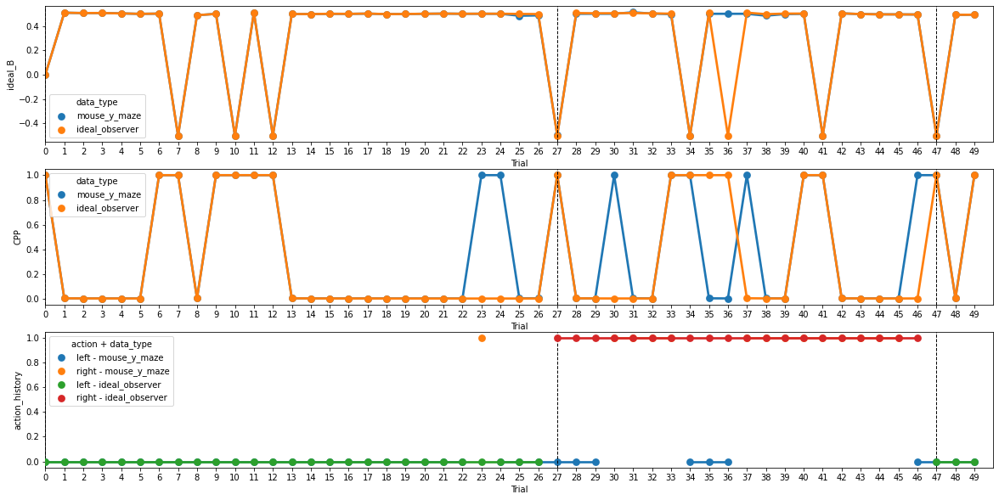

In [300]:
fig,ax = pl.subplots(3,1,figsize=(20,10))
sns.pointplot(x="Trial",y="ideal_B",hue="data_type",data=eg_b_cpp,ax=ax[0])
sns.pointplot(x="Trial",y="CPP",hue="data_type",data=eg_b_cpp,ax=ax[1])
sns.pointplot(x="Trial",y="action_history",hue="action + data_type",data=eg_b_cpp,ax=ax[2])
# sns.pointplot(x="Trial",y="r-t0",hue="data_type",data=eg_b_cpp,ax=ax[3])
cps = np.array(eg_b_cpp["change_point"])
ind_cp = np.where(cps==1.0)[0]
for x in ax:
    ylims = x.get_ylim()
    for ic in ind_cp:
        x.vlines(x=ic,ymin=ylims[0],ymax=ylims[1],color='k',ls='dashed',lw=1.0)
    x.set_ylim(ylims[0],ylims[1])
    x.set_xlim(0,tr)
fig.savefig(fig_target_dir+"Example_comparison_mouse_ideal_observer.png")
# ax[2].set_ylim(-1,1)

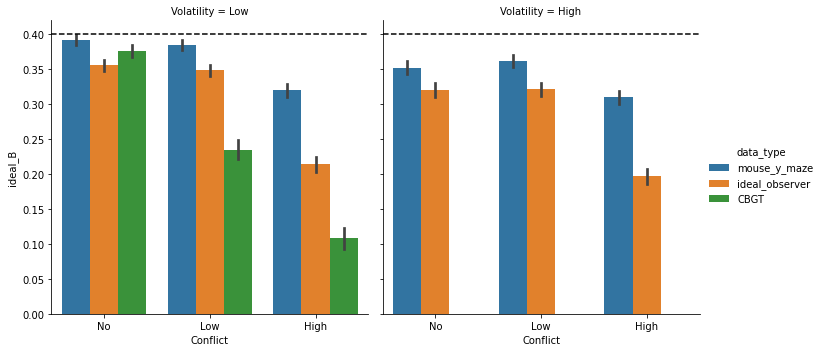

In [301]:
g1 = sns.catplot(x="Conflict",y="ideal_B",data=B_CPP_df_all,hue="data_type",col="Volatility",kind='bar',order=["No","Low","High"])
for ax in g1.axes[0]:
    xlims = ax.get_xlim()
    ax.hlines(y=0.4,xmin=xlims[0],xmax=xlims[1],ls='dashed',color='k')
    ax.set_xlim(xlims[0],xlims[1])
g1.savefig(fig_target_dir+"Average_ideal_B_comparison.png")

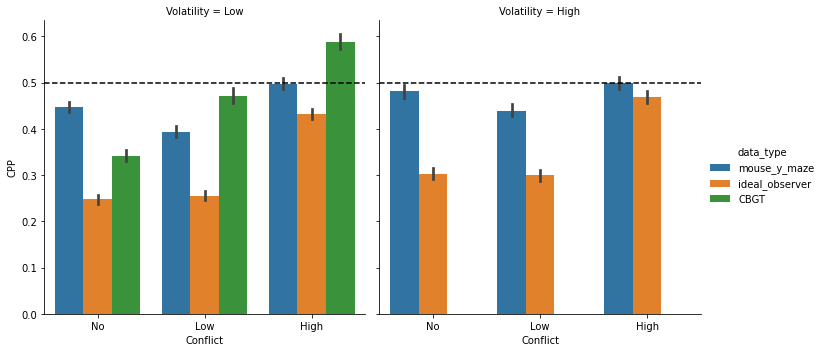

In [302]:
g1 = sns.catplot(x="Conflict",y="CPP",data=B_CPP_df_all,hue="data_type",col="Volatility",kind='bar',order=["No","Low","High"])
for ax in g1.axes[0]:
    xlims = ax.get_xlim()
    ax.hlines(y=0.5,xmin=xlims[0],xmax=xlims[1],ls='dashed',color='k')
    ax.set_xlim(xlims[0],xlims[1])

g1.savefig(fig_target_dir+"Average_CPP_comparison.png")

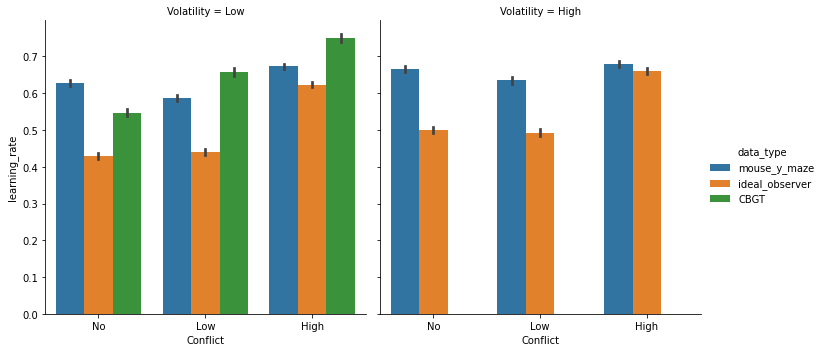

In [303]:
g1 = sns.catplot(x="Conflict",y="learning_rate",data=B_CPP_df_all,hue="data_type",col="Volatility",kind='bar',order=["No","Low","High"])
g1.savefig(fig_target_dir+"Average_learning_rate_comparison.png")

In [304]:
# for grp in B_CPP_df.groupby(["Conflict","Volatility","Condition","Session"]):
#     fig,ax = pl.subplots(1,1,figsize=(16,9))
#     dat_slice = grp[1][["ideal_B","CPP","Trial"]]
#     dat_slice_melt = dat_slice.melt("Trial")
#     sns.lineplot(x="Trial",y="value",hue="variable",data=dat_slice_melt,ax=ax)
#     fig.savefig(fig_target_dir+"B_CPP_df_"+grp[0][0]+"_"+grp[0][1]+"_"+grp[0][2]+"_"+str(grp[0][3])+".png")

/tmp/ipykernel_19515/1327026856.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = pl.subplots(1,1,figsize=(16,9))


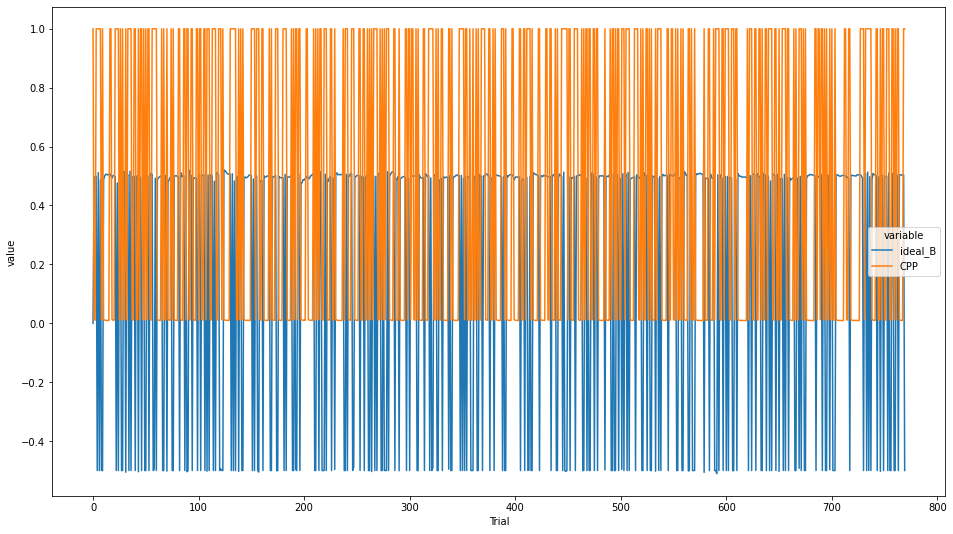

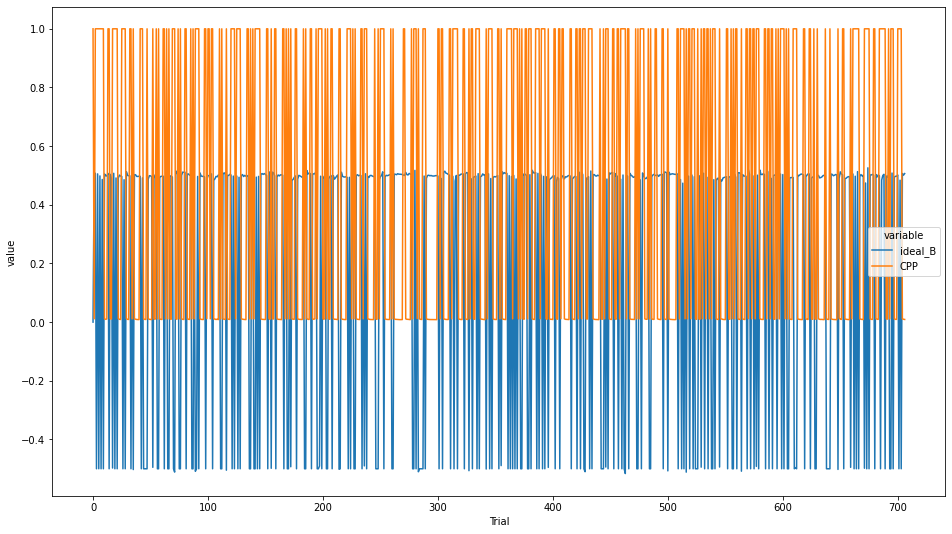

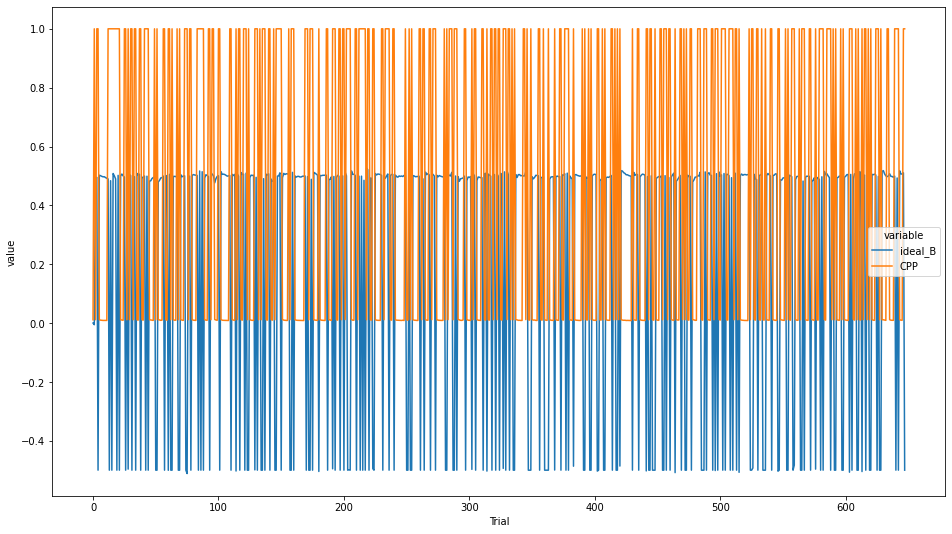

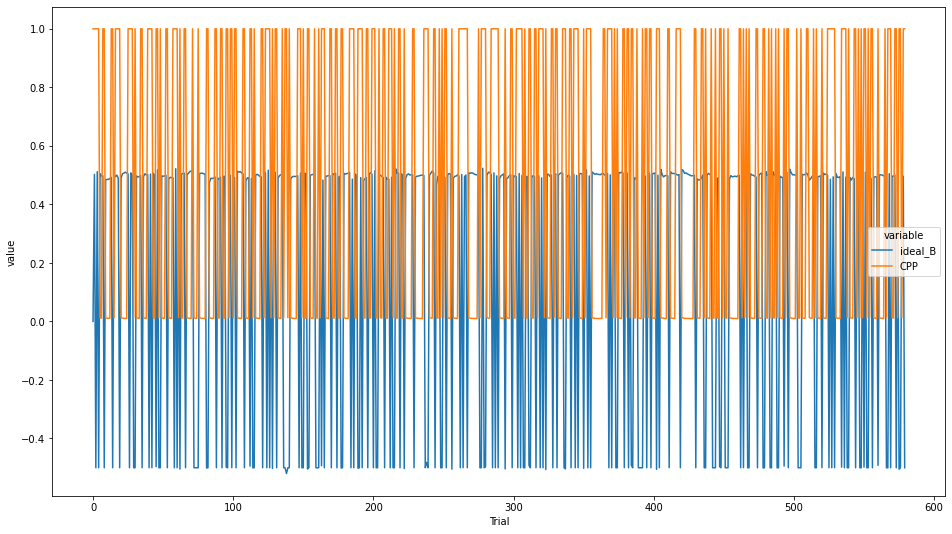

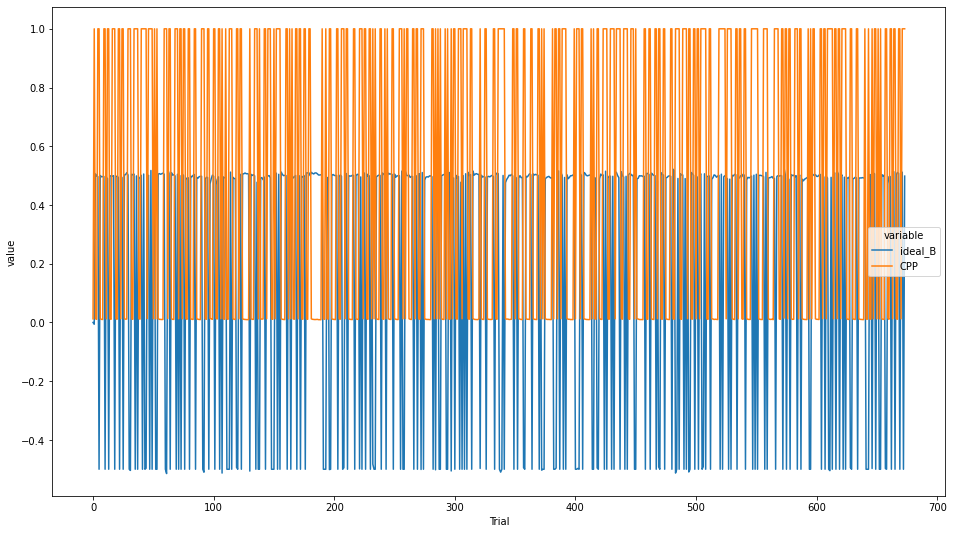

...

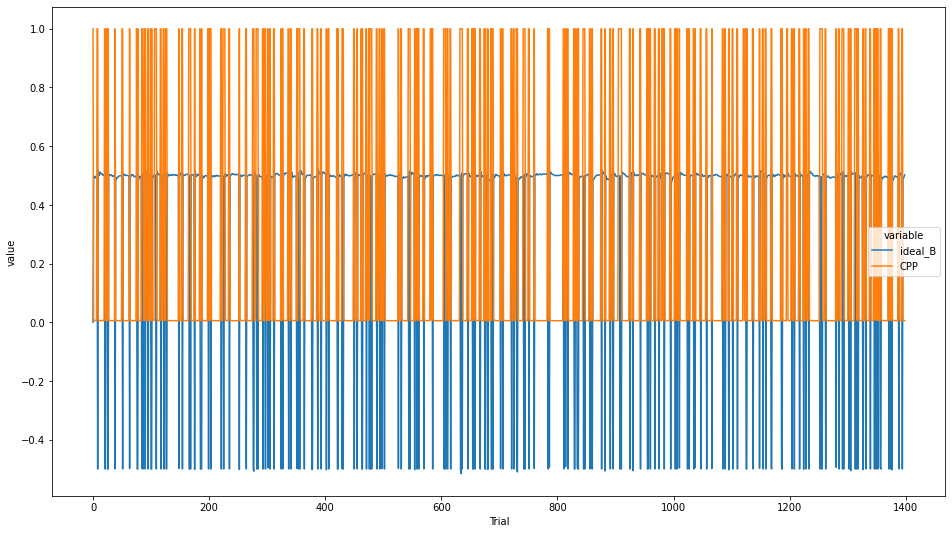

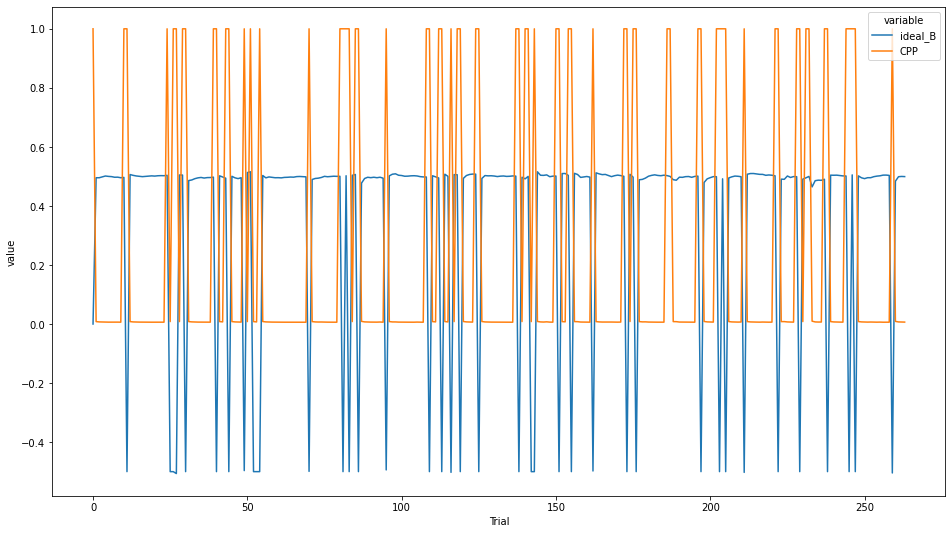

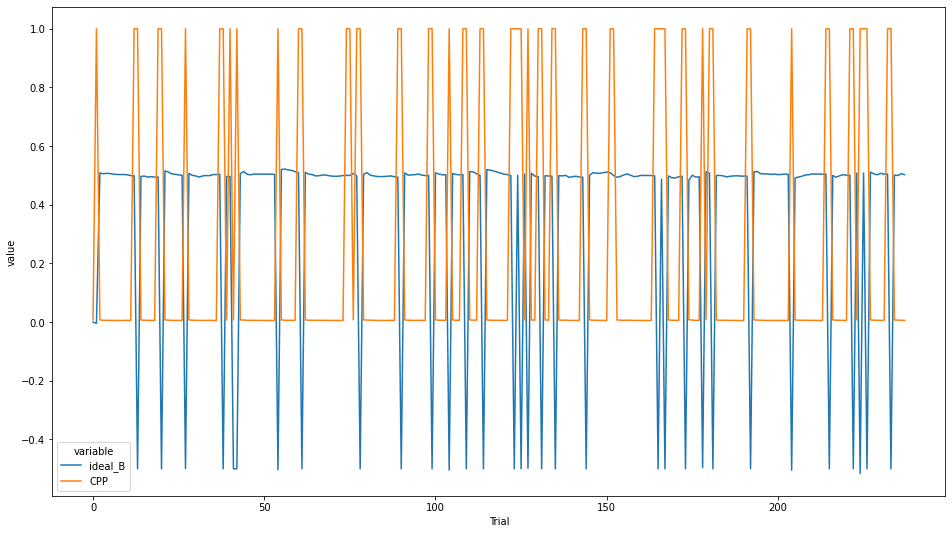

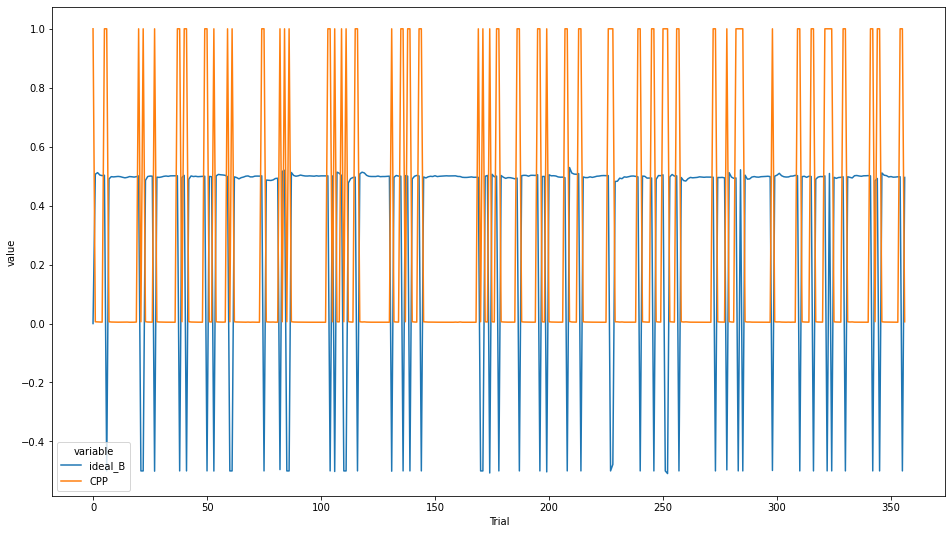

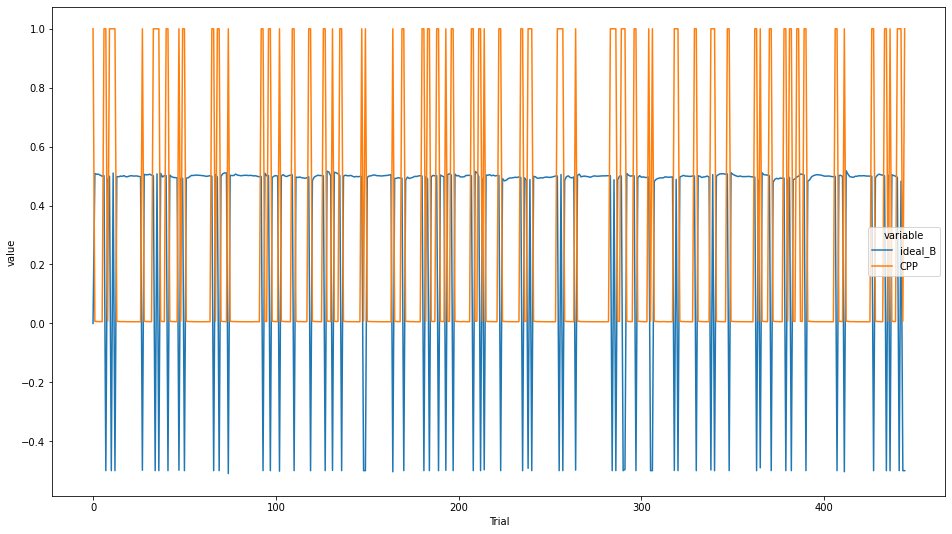

In [305]:
for grp in B_CPP_df_io.groupby(["Conflict","Volatility","Condition","Session"]):
    fig,ax = pl.subplots(1,1,figsize=(16,9))
    dat_slice = grp[1][["ideal_B","CPP","Trial"]]
    dat_slice_melt = dat_slice.melt("Trial")
    sns.lineplot(x="Trial",y="value",hue="variable",data=dat_slice_melt,ax=ax)
    fig.savefig(fig_target_dir+"B_CPP_df_ideal_observer"+grp[0][0]+"_"+grp[0][1]+"_"+grp[0][2]+"_"+str(grp[0][3])+".png")

In [306]:
#g1 = sns.catplot(x="Trial",y="CPP",hue='Day',data=B_CPP_df.loc[(B_CPP_df["Condition"]=="Control")& (B_CPP_df["Conflict"]=="No" )],kind='point')

In [307]:
#g2 = sns.catplot(x="Trial",y="B_diff",hue='Day',data=B_CPP_df.loc[(B_CPP_df["Condition"]=="Control")& (B_CPP_df["Conflict"]=="No" )],kind='point')

In [334]:
def align_b_cpp_to_change_point(B_CPP_df):
    max_lag = 6 # -1 to 5
    cp_aligned_B = pd.DataFrame(columns=["Volatility","Condition","Conflict","Session","B_diff","CPP","time_from_change_point","signed_B_diff","Block","ideal_B","learning_rate","MC","sF","slice_number","reaction_time"])
    sn = 0
    for grp in B_CPP_df.groupby(["Volatility","Condition","Conflict","Session","Block"]):
        ind_cp = np.where(grp[1]["change_point"]==1.0)[0]
        #print(ind_cp)
        mask_cp = np.logical_and(ind_cp!=0,ind_cp!=len(grp[1])-1)
        ind_cp = ind_cp[mask_cp]
        #print(ind_cp)
        for ic in ind_cp:
            dat_slice = grp[1].iloc[ic-1:ic+max_lag]
            #print(dat_slice)
            for l in np.arange(max_lag):
                if l < len(dat_slice)-1:
                    lag_dat = dat_slice.iloc[l]
                    cp_aligned_B = cp_aligned_B.append({"Volatility":grp[0][0],"Condition":grp[0][1],"Conflict":grp[0][2],"Session":grp[0][3],"B_diff":lag_dat["B_diff"],"CPP":lag_dat["CPP"],"time_from_change_point":l-1,"signed_B_diff":lag_dat["signed_B_diff"],"Block":grp[0][4],"ideal_B":lag_dat["ideal_B"],"learning_rate":lag_dat["learning_rate"],"MC":lag_dat["MC"],"sF":lag_dat["sF"],"slice_number":sn,"reaction_time":lag_dat["reaction_time"]/1000. },ignore_index=True)

                else:
                    continue
            sn+=1
    
    cp_aligned_B["Conflict + Volatility"] = cp_aligned_B["Conflict"] +" - "+cp_aligned_B["Volatility"]
    cp_aligned_B["Conflict + Block"] = cp_aligned_B["Conflict"] +" - "+cp_aligned_B["Block"] 
    cp_aligned_B["Volatility + Block"] = cp_aligned_B["Volatility"] +" - "+cp_aligned_B["Block"] 


    return cp_aligned_B



In [335]:
cp_aligned_B = align_b_cpp_to_change_point(B_CPP_df)
cp_aligned_B.to_csv(data_target_dir+"Change_point_aligned_B_CPP.csv")

In [336]:
cp_aligned_B_io = align_b_cpp_to_change_point(B_CPP_df_io)
cp_aligned_B_io.to_csv(data_target_dir+"Change_point_aligned_B_CPP_ideal_observer.csv")

In [337]:
cp_aligned_B_cbgt = align_b_cpp_to_change_point(B_CPP_df_cbgt)
cp_aligned_B_cbgt.to_csv(data_target_dir+"Change_point_aligned_B_CPP_cbgt.csv")

In [338]:
cp_aligned_B["data_type"] = "mouse_Y_maze"
cp_aligned_B_io["data_type"] = "ideal_observer"
cp_aligned_B_cbgt["data_type"] = "cbgt"
all_cp_aligned_B = cp_aligned_B.append(cp_aligned_B_io)
all_cp_aligned_B = all_cp_aligned_B.append(cp_aligned_B_cbgt)
day_limit = -1

In [340]:
all_cp_aligned_B = all_cp_aligned_B.reset_index()

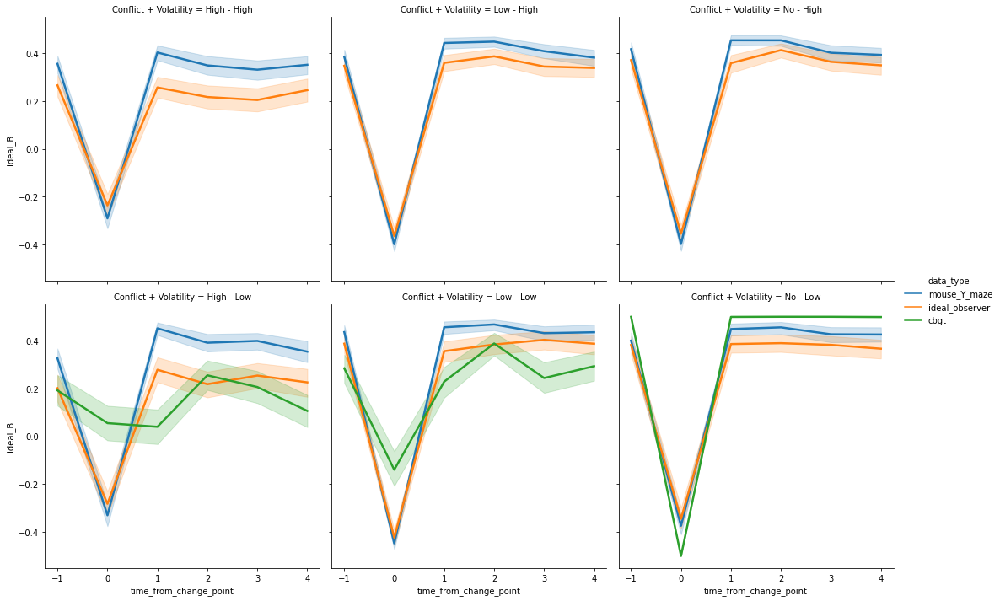

In [341]:
g1 = sns.relplot(x="time_from_change_point",y="ideal_B",data=all_cp_aligned_B,hue="data_type",col="Conflict + Volatility",kind='line',col_wrap=3,lw=2.5)
g1.savefig(fig_target_dir+"mouse_vs_ideal_observer_vs_cbgt_ideal_B.png")

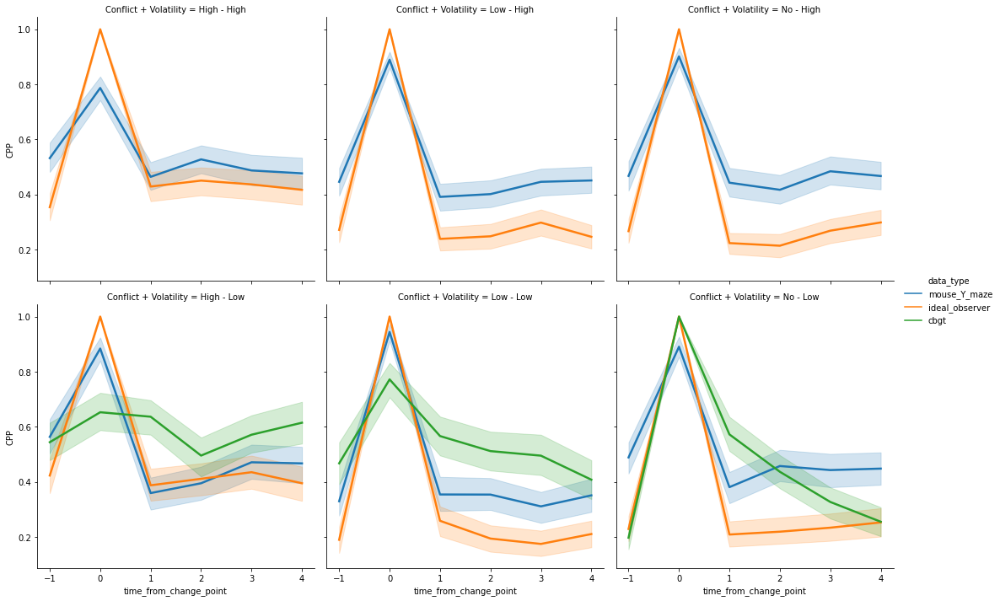

In [342]:
g1 = sns.relplot(x="time_from_change_point",y="CPP",data=all_cp_aligned_B,hue="data_type",col="Conflict + Volatility",kind='line',col_wrap=3,lw=2.5)
g1.savefig(fig_target_dir+"mouse_vs_ideal_observer_vs_cbgt_CPP.png")

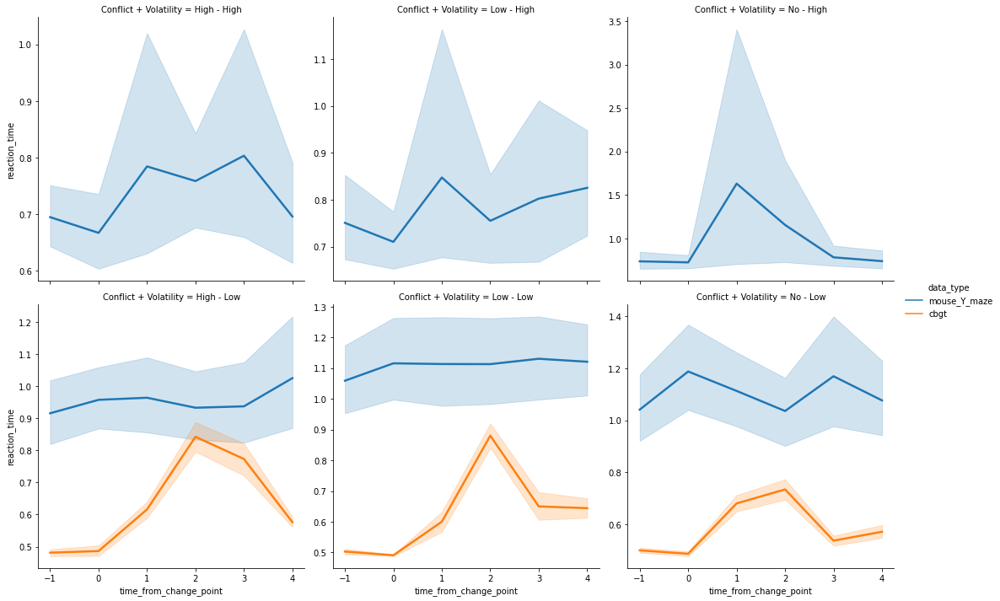

In [343]:
g1 = sns.relplot(x="time_from_change_point",y="reaction_time",data=all_cp_aligned_B.loc[(all_cp_aligned_B["data_type"]=="mouse_Y_maze")|(all_cp_aligned_B["data_type"]=="cbgt")],hue="data_type",col="Conflict + Volatility",kind='line',col_wrap=3,lw=2.5,facet_kws={'sharey': False})
#g1.set(yscale="log")
g1.savefig(fig_target_dir+"mouse_vs_ideal_observer_vs_cbgt_rt.png")

In [172]:
all_cp_aligned_B["Block + data_type"] = all_cp_aligned_B["Block"]+" - "+all_cp_aligned_B["data_type"]

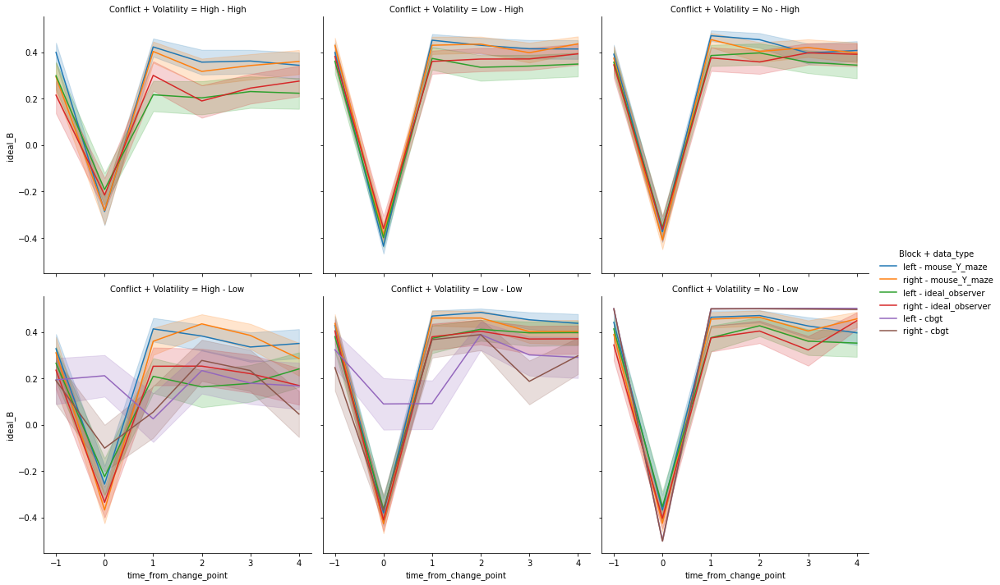

In [173]:
g1 = sns.relplot(x="time_from_change_point",y="ideal_B",data=all_cp_aligned_B,hue="Block + data_type",col="Conflict + Volatility",kind='line',col_wrap=3)
g1.savefig(fig_target_dir+"mouse_vs_ideal_observer_bias.png")

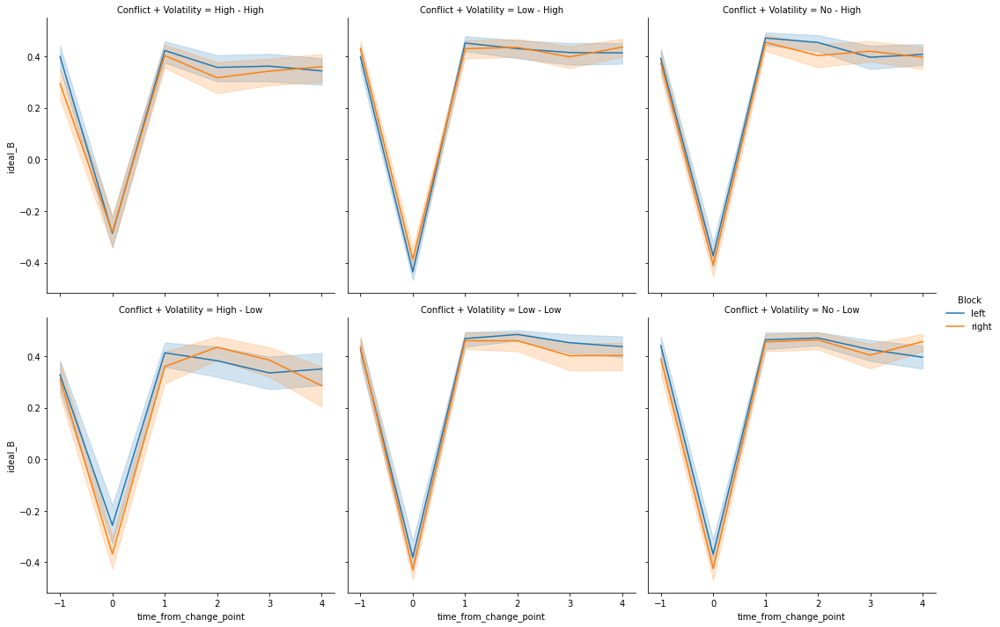

In [174]:
g1 = sns.relplot(x="time_from_change_point",y="ideal_B",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)


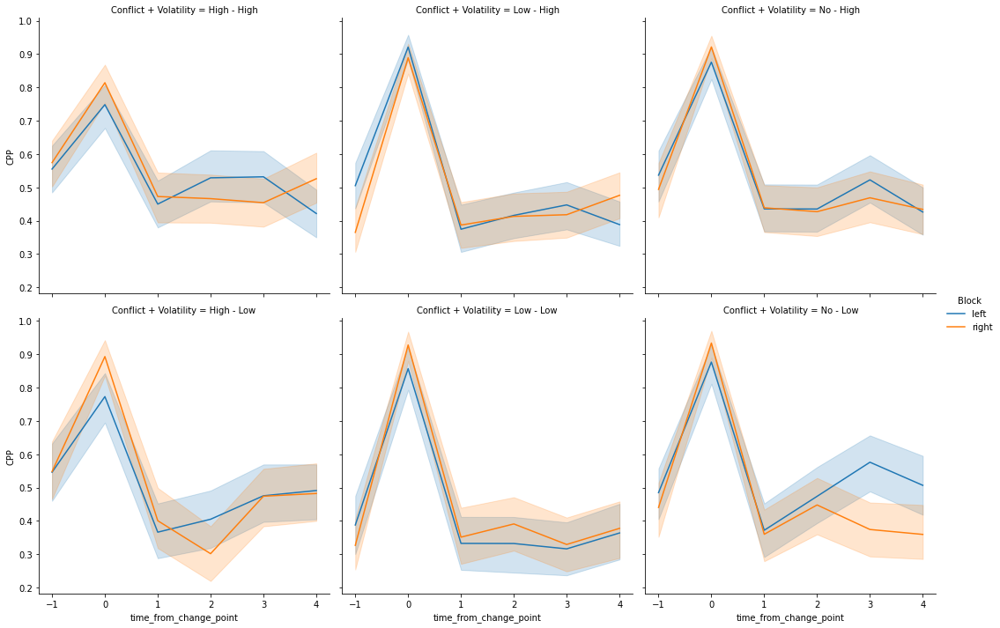

In [175]:
g2 = sns.relplot(x="time_from_change_point",y="CPP",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

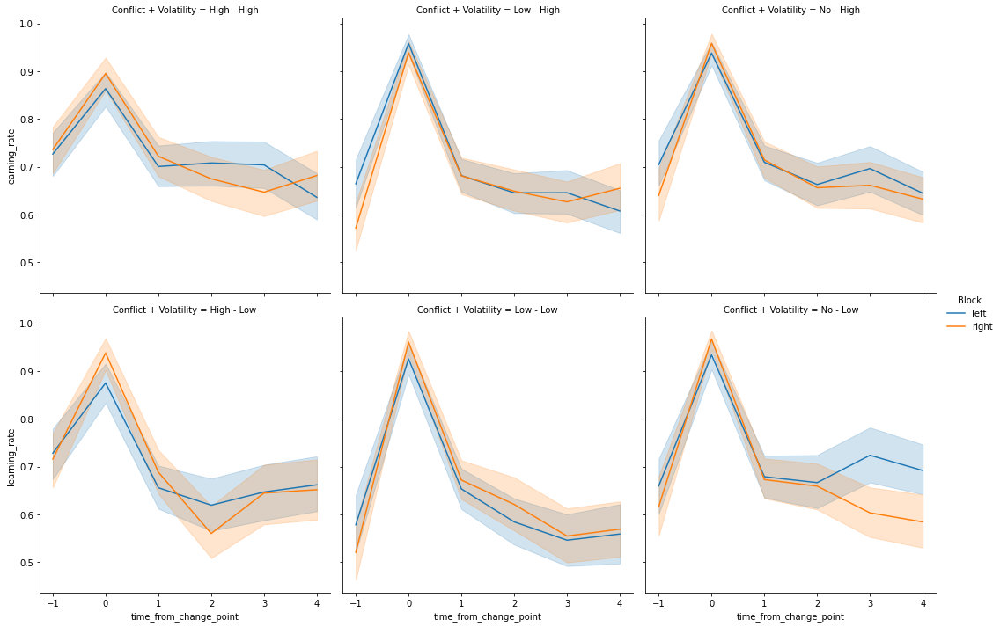

In [176]:
g2 = sns.relplot(x="time_from_change_point",y="learning_rate",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

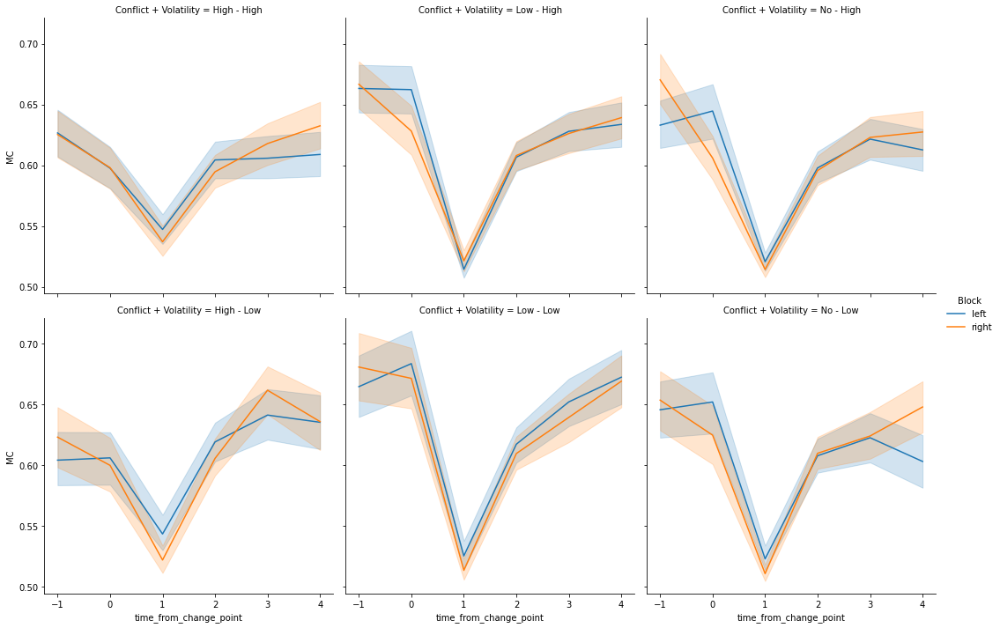

In [177]:
g2 = sns.relplot(x="time_from_change_point",y="MC",data=cp_aligned_B,hue="Block",col="Conflict + Volatility",kind='line',col_wrap=3)

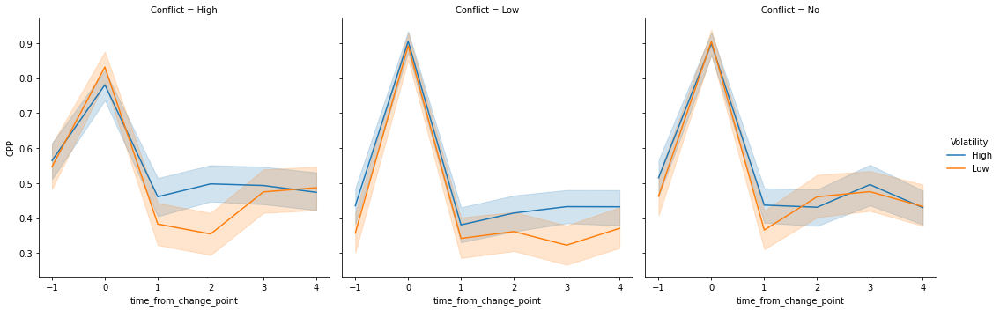

In [178]:
g4 = sns.relplot(x="time_from_change_point",y="CPP",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line')

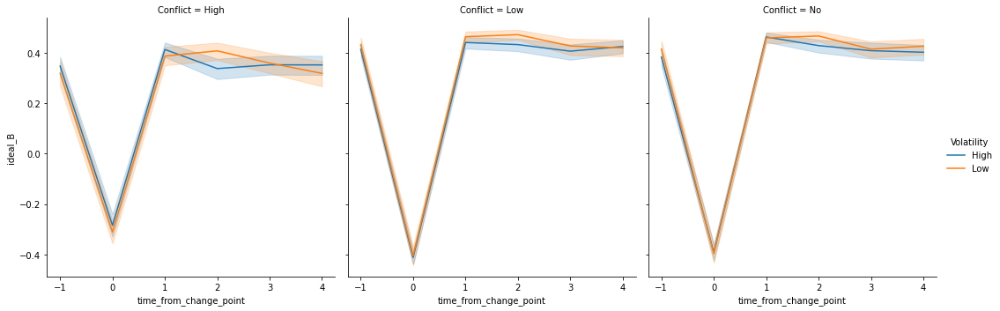

In [179]:
g5 = sns.relplot(x="time_from_change_point",y="ideal_B",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

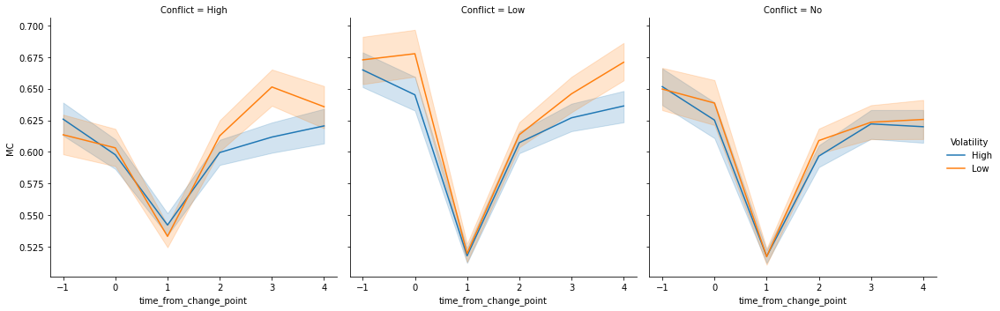

In [180]:
g5 = sns.relplot(x="time_from_change_point",y="MC",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

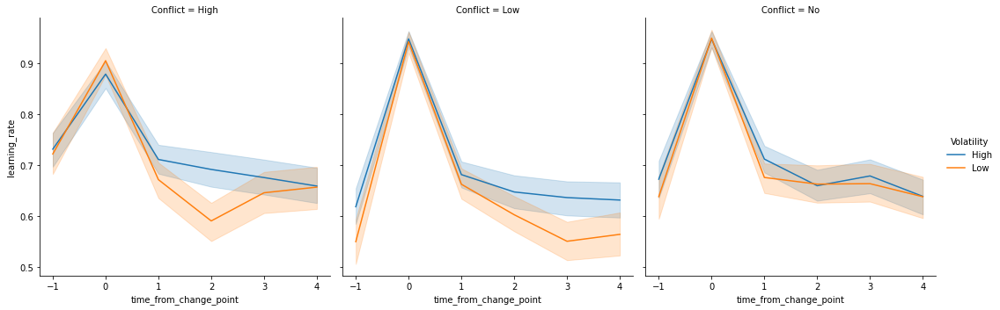

In [181]:
g5 = sns.relplot(x="time_from_change_point",y="learning_rate",data=cp_aligned_B,hue="Volatility",col="Conflict",kind='line',col_wrap=3)

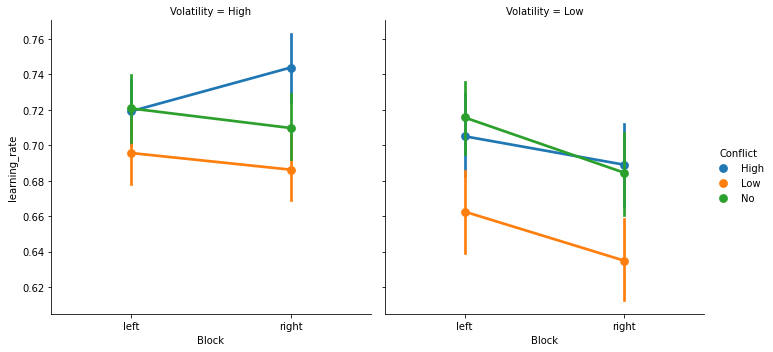

In [20]:
sns.catplot(x="Block",y="learning_rate",hue="Conflict",col="Volatility",kind="point",data=cp_aligned_B)